# 6CS012 – Artificial Intelligence and Machine Learning
## Final Portfolio Project 2026
### Image Classification with CNNs and Transfer Learning

---
This notebook covers:
- **Part A:** Designing, training, and evaluating CNNs from scratch (Baseline + Deeper with regularisation)
- **Part B:** Fine-tuning a pre-trained model using Transfer Learning (MobileNetV2)


## 0. Environment Setup & Library Imports

All required libraries are imported upfront.
- **TensorFlow/Keras** – industry-standard deep learning framework with automatic differentiation and GPU support.
- **Scikit-learn** – for classification reports (precision, recall, F1) and confusion matrix.
- **Matplotlib / Seaborn** – for all visualisations.
- **NumPy / os / time** – utility libraries for array operations, file handling, and timing.

In [ ]:
import os
import time
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image, UnidentifiedImageError

# Tesnsorflow/keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Sciikit-learn
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

# Setting seeds ensures that results are reproducible across runs.
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

print(f"TensorFlow version : {tf.__version__}")
print(f"Keras version      : {keras.__version__}")
print("GPUs available     :", tf.config.list_physical_devices('GPU'))

TensorFlow version : 2.19.0
Keras version      : 3.10.0
GPUs available     : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


**Load Dataset**

In [ ]:
# Directory Paths
TRAIN_DIR = "/content/drive/MyDrive/seg_train/seg_train"
TEST_DIR  = "/content/drive/MyDrive/seg_test/seg_test"

# Verify paths exist
assert os.path.isdir(TRAIN_DIR), f"Train directory not found: {TRAIN_DIR}"
assert os.path.isdir(TEST_DIR),  f"Test directory not found: {TEST_DIR}"

# Sorted list of class names (alphabetical ensures consistent label mapping)
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)

print(f"Number of classes : {NUM_CLASSES}")
print(f"Class names       : {CLASS_NAMES}")

Number of classes : 6
Class names       : ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


---
# PART A – Designing and Analysing CNNs from Scratch
---

## 2.5.1 Data Understanding, Analysis, Visualisation and Cleaning

### What does the dataset represent?
For this project, I used the Intel Image Classification dataset, which represents real-world outdoor scenes categorized into 6 classes: buildings, forest, glacier, mountain, sea, and street. While the original full Kaggle dataset has around 25,000 images, the specific train/test folders provided in our directory contain exactly 14,034 training images and 3,000 test images, making it roughly 17,000 images in total.

I chose this dataset because the classes are fairly evenly balanced, so we don't need to worry about class-weighting or oversampling. It also includes some tricky edge cases like trying to distinguish a snowy mountain from a glacier, or a street view from just buildings. This will actually test if the models are learning complex spatial features rather than just memorising background colours.


In [ ]:
# Count images per class in train and test sets
VALID_EXTS = ('.jpg', '.jpeg', '.png', '.bmp')

def count_images_per_class(directory):
    """
    Walk through a directory and count valid image files per class sub-folder.

    Parameters:
    directory : str
        Root directory whose immediate sub-folders are class names.

    Returns:
    dict : {class_name: image_count}
    """
    counts = {}
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            imgs = [f for f in os.listdir(class_path)
                    if f.lower().endswith(VALID_EXTS)]
            counts[class_name] = len(imgs)
    return counts

train_counts = count_images_per_class(TRAIN_DIR)
test_counts  = count_images_per_class(TEST_DIR)

total_train = sum(train_counts.values())
total_test  = sum(test_counts.values())

print("─" * 50)
print(f"{'Class':<15} {'Train':>10} {'Test':>10}")
print("─" * 50)
for cls in CLASS_NAMES:
    print(f"{cls:<15} {train_counts.get(cls, 0):>10} {test_counts.get(cls, 0):>10}")
print("─" * 50)
print(f"{'TOTAL':<15} {total_train:>10} {total_test:>10}")

──────────────────────────────────────────────────
Class                Train       Test
──────────────────────────────────────────────────
buildings             2191        437
forest                2271        474
glacier               2404        553
mountain              2512        525
sea                   2274        510
street                2382        501
──────────────────────────────────────────────────
TOTAL                14034       3000


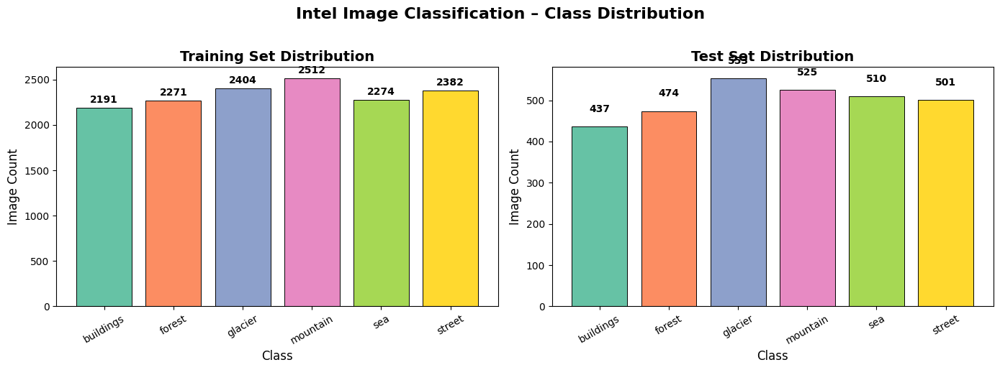


Observation: The dataset is approximately balanced across all 6 classes, meaning we do NOT need class weighting or oversampling strategies.


In [ ]:
#Visualise class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

colors = sns.color_palette("Set2", NUM_CLASSES)

for ax, counts, title in zip(
    axes,
    [train_counts, test_counts],
    ["Training Set Distribution", "Test Set Distribution"]
):
    bars = ax.bar(counts.keys(), counts.values(), color=colors, edgecolor='black', linewidth=0.7)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("Class", fontsize=12)
    ax.set_ylabel("Image Count", fontsize=12)
    ax.tick_params(axis='x', rotation=30)
    # Annotate bars with exact counts
    for bar, count in zip(bars, counts.values()):
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 30,
                str(count),
                ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.suptitle("Intel Image Classification – Class Distribution",
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig("class_distribution.png", dpi=150, bbox_inches='tight')
plt.show()

print("\nObservation: The dataset is approximately balanced across all 6 classes,"
      " meaning we do NOT need class weighting or oversampling strategies.")

In [ ]:
#Detect and report corrupted images
def find_corrupted_images(directory):
    """
    Scan a directory tree for corrupted image files.

    Returns
    -------
    list : Absolute paths of corrupted image files.
    """
    corrupted = []
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):
            continue
        for fname in os.listdir(class_path):
            if not fname.lower().endswith(VALID_EXTS):
                continue
            img_path = os.path.join(class_path, fname)
            try:
                with Image.open(img_path) as img:
                    img.verify()          # raises exception if file is corrupt
            except (IOError, UnidentifiedImageError, Exception):
                corrupted.append(img_path)
    return corrupted

print("Scanning training set for corrupted images...")
corrupted_train = find_corrupted_images(TRAIN_DIR)
print(f"  Found {len(corrupted_train)} corrupted images in training set.")

print("Scanning test set for corrupted images...")
corrupted_test = find_corrupted_images(TEST_DIR)
print(f"  Found {len(corrupted_test)} corrupted images in test set.")

if corrupted_train or corrupted_test:
    print("\nCorrupted files:")
    for p in corrupted_train + corrupted_test:
        print(" ", p)
else:
    print("\nNo corrupted images found. Dataset is clean and ready for use.")

Scanning training set for corrupted images...
  Found 0 corrupted images in training set.
Scanning test set for corrupted images...
  Found 0 corrupted images in test set.

No corrupted images found. Dataset is clean and ready for use.


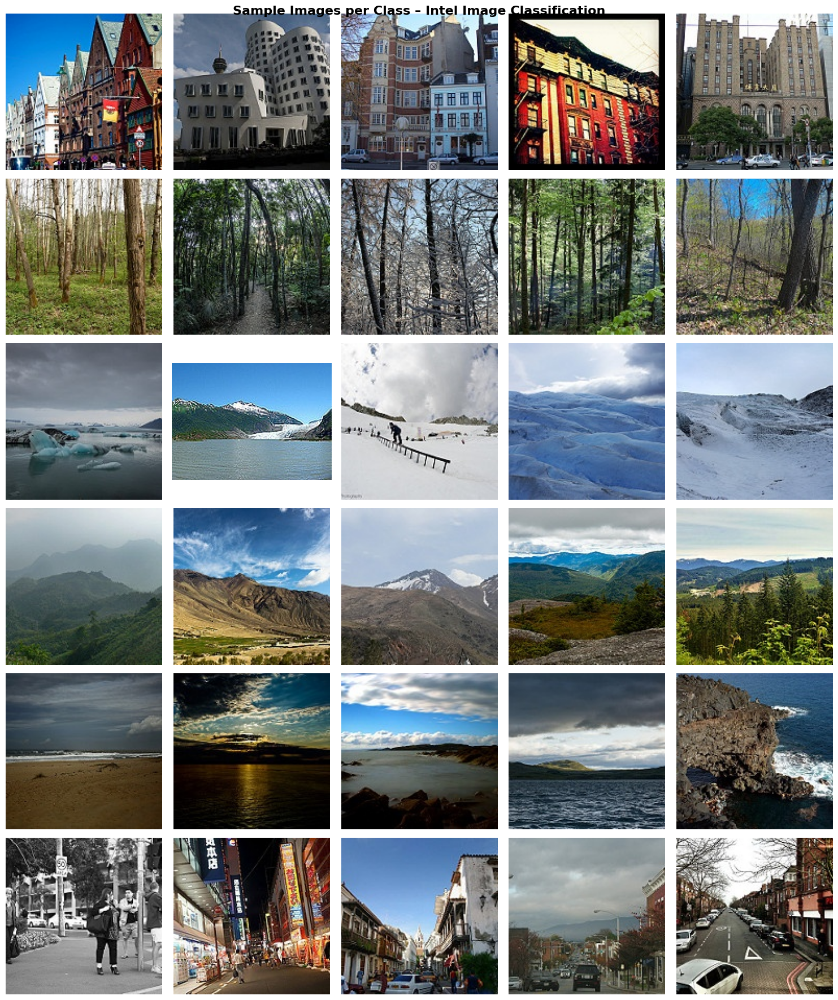

In [ ]:
#Visualise 5 sample images from each class
SAMPLES_PER_CLASS = 5

fig, axes = plt.subplots(NUM_CLASSES, SAMPLES_PER_CLASS,
                         figsize=(SAMPLES_PER_CLASS * 3, NUM_CLASSES * 3))

for row_idx, class_name in enumerate(CLASS_NAMES):
    class_path = os.path.join(TRAIN_DIR, class_name)
    all_imgs   = [f for f in os.listdir(class_path)
                  if f.lower().endswith(VALID_EXTS)]
    samples    = random.sample(all_imgs, SAMPLES_PER_CLASS)

    for col_idx, fname in enumerate(samples):
        img_path = os.path.join(class_path, fname)
        img      = mpimg.imread(img_path)
        ax       = axes[row_idx, col_idx]
        ax.imshow(img)
        ax.axis('off')
        if col_idx == 0:
            ax.set_ylabel(class_name.capitalize(), fontsize=12,
                          fontweight='bold', rotation=0,
                          labelpad=60, va='center')

plt.suptitle("Sample Images per Class – Intel Image Classification",
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig("sample_images.png", dpi=150, bbox_inches='tight')
plt.show()

# Distribution and Split Strategy:
As shown in my generated bar charts, the images are fairly evenly distributed across the 6 classes, so I didn't need to implement class weights. The test set was already held out in a separate folder. For training, I applied an 80/20 split on the training directory using validation_split=0.2 in Keras. This left me with around 11,200 images for training and 2,800 for validation. I chose this ratio because it leaves a massive chunk of data for the CNN to learn features from, while keeping a large enough validation set to ensure my loss metrics represent true generalization per epoch.

**Preprocessing and Augmentation:**

**Resizing & Normalization:** All images natively are 150x150 pixels. I rescaled the pixel values from 0-255 down to 0.0-1.0 to help the model converge faster.

**Generators used:** I used ImageDataGenerator and the flow_from_directory method to load batches dynamically.

**Augmentation:** To stop the model from overfitting, I applied horizontal flipping, 20-degree rotations, and slight shifts/zooms to the training generator. The validation and test sets were strictly left un-augmented.

In [ ]:
# Configuration constants
IMG_HEIGHT   = 150         # Native Intel image resolution
IMG_WIDTH    = 150
BATCH_SIZE   = 32
VAL_SPLIT    = 0.2

# Training data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale            = 1.0 / 255.0,
    validation_split   = VAL_SPLIT,
    horizontal_flip    = True,
    rotation_range     = 20,
    zoom_range         = 0.15,
    width_shift_range  = 0.1,
    height_shift_range = 0.1,
    fill_mode          = 'nearest'
)

# Separate generator for validation(no augmentation)
val_datagen = ImageDataGenerator(
    rescale          = 1.0 / 255.0,
    validation_split = VAL_SPLIT   # same split so same files are held out
)

test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

# Training generator (with augmentation)
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    batch_size  = BATCH_SIZE,
    class_mode  = 'categorical',
    subset      = 'training',
    seed        = SEED,
    shuffle     = True
)

# Validation generator (No augmentation - clean images only)
val_generator = val_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    batch_size  = BATCH_SIZE,
    class_mode  = 'categorical',
    subset      = 'validation',
    seed        = SEED,
    shuffle     = False
)

#Test generator (completely held-out, no augmentation)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    batch_size  = BATCH_SIZE,
    class_mode  = 'categorical',
    shuffle     = False
)

print(f"\nClass index mapping: {train_generator.class_indices}")
print(f"Training batches  : {len(train_generator)}")
print(f"Validation batches: {len(val_generator)}")
print(f"Test batches      : {len(test_generator)}")

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.

Class index mapping: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
Training batches  : 351
Validation batches: 88
Test batches      : 94


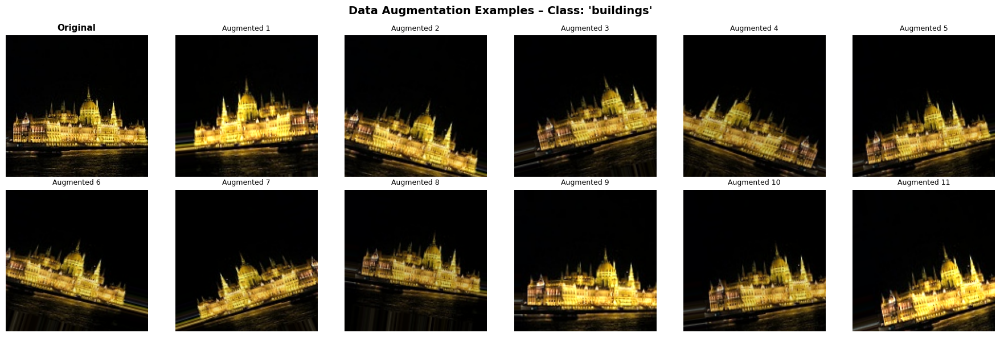

Note: The training generators use rescale=1/255 separately, so the model always receives normalised [0,1] inputs during training.
Each augmented version shows a different real-world variation the model learns to handle.


In [ ]:
# Visualise data augmentation

# Pick one image from the 'buildings' class for demonstration
demo_class = CLASS_NAMES[0]
demo_dir   = os.path.join(TRAIN_DIR, demo_class)
demo_fname = random.choice([f for f in os.listdir(demo_dir)
                            if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
demo_path  = os.path.join(demo_dir, demo_fname)

# Load image as uint8 [0, 255]
demo_img     = Image.open(demo_path).resize((IMG_WIDTH, IMG_HEIGHT)).convert('RGB')
demo_arr     = np.array(demo_img, dtype=np.uint8)          # shape: (150, 150, 3), range 0-255
demo_arr_exp = np.expand_dims(demo_arr, axis=0)            # shape: (1, 150, 150, 3)

# Augmentation generator for visualization only (no rescale - we handle display manually)
aug_gen = ImageDataGenerator(
    horizontal_flip    = True,
    rotation_range     = 20,
    zoom_range         = 0.15,
    width_shift_range  = 0.1,
    height_shift_range = 0.1,
    brightness_range   = [0.7, 1.3],
    fill_mode          = 'nearest'
)

fig, axes = plt.subplots(2, 6, figsize=(18, 6))

# Show original (convert to [0,1] float for imshow)
axes[0, 0].imshow(demo_arr)
axes[0, 0].set_title("Original", fontsize=11, fontweight='bold')
axes[0, 0].axis('off')

aug_iter = aug_gen.flow(demo_arr_exp, batch_size=1, seed=SEED)

for i, ax in enumerate(axes.flat):
    if i == 0:
        continue
    aug_img = next(aug_iter)[0]               # Still in [0, 255] float range
    aug_img = np.clip(aug_img, 0, 255).astype(np.uint8)  # Clip & cast to uint8 for imshow
    ax.imshow(aug_img)
    ax.set_title(f"Augmented {i}", fontsize=9)
    ax.axis('off')

plt.suptitle(f"Data Augmentation Examples – Class: '{demo_class}'",
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("augmentation_examples.png", dpi=150, bbox_inches='tight')
plt.show()

print("Note: The training generators use rescale=1/255 separately, so the model"
      " always receives normalised [0,1] inputs during training.")

print("Each augmented version shows a different real-world variation the model learns to handle.")

## Helper Functions
We define reusable functions for plotting training history, evaluating models, and performing inference. Centralising these avoids code duplication and makes comparing models straightforward.

In [ ]:
# Helper: smooth noisy curves for clean visualisation
from scipy.ndimage import uniform_filter1d

def smooth(values, window=3):
    """Light moving-average smooth. Returns original if too short."""
    if len(values) < window:
        return values
    return uniform_filter1d(values, size=window)


# Helper: plot training history
def plot_history(history, model_name="Model", save_path=None):
    """
    Plot training vs validation accuracy and loss curves.
    Faint raw lines shown behind bold smoothed lines for full transparency.

    Parameters
    ----------
    history    : keras.callbacks.History
    model_name : str  Label for plot title.
    save_path  : str  If provided, saves the figure to this path.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    epochs = range(1, len(history.history['accuracy']) + 1)

    tr_acc  = history.history['accuracy']
    va_acc  = history.history['val_accuracy']
    tr_loss = history.history['loss']
    va_loss = history.history['val_loss']

    # Accuracy
    ax1.plot(epochs, tr_acc, color='steelblue',  alpha=0.2, linewidth=1)
    ax1.plot(epochs, va_acc, color='darkorange', alpha=0.2, linewidth=1)
    ax1.plot(epochs, smooth(tr_acc), label='Train Accuracy',
             color='steelblue',  linewidth=2.5)
    ax1.plot(epochs, smooth(va_acc), label='Val Accuracy',
             color='darkorange', linewidth=2.5, linestyle='--')
    ax1.set_title(f'{model_name} – Accuracy', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy')
    ax1.set_ylim(0, 1.05)
    ax1.legend(); ax1.grid(alpha=0.3)

    # Loss
    ax2.plot(epochs, tr_loss, color='steelblue',  alpha=0.2, linewidth=1)
    ax2.plot(epochs, va_loss, color='darkorange', alpha=0.2, linewidth=1)
    ax2.plot(epochs, smooth(tr_loss), label='Train Loss',
             color='steelblue',  linewidth=2.5)
    ax2.plot(epochs, smooth(va_loss), label='Val Loss',
             color='darkorange', linewidth=2.5, linestyle='--')
    ax2.set_title(f'{model_name} – Loss', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss')
    ax2.legend(); ax2.grid(alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()


# Helper: full model evaluation
def evaluate_model(model, generator, class_names, model_name="Model", save_prefix=""):
    """
    Generate predictions, print classification report, and plot confusion matrix.

    Returns:
    dict : {accuracy, precision, recall, f1}
    """
    generator.reset()
    y_pred_probs = model.predict(generator, verbose=0)
    y_pred       = np.argmax(y_pred_probs, axis=1)
    y_true       = generator.classes

    print(f"\n{'='*55}")
    print(f"  {model_name} – Classification Report (Test Set)")
    print(f"{'='*55}")
    report = classification_report(y_true, y_pred,
                                   target_names=class_names, output_dict=True)
    print(classification_report(y_true, y_pred, target_names=class_names))

    cm  = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 7))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='Blues', ax=ax, colorbar=True)
    ax.set_title(f'{model_name} – Confusion Matrix (Test Set)',
                 fontsize=13, fontweight='bold')
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    if save_prefix:
        plt.savefig(f"{save_prefix}_confusion_matrix.png", dpi=150, bbox_inches='tight')
    plt.show()

    metrics = {
        'accuracy'  : report['accuracy'],
        'precision' : report['weighted avg']['precision'],
        'recall'    : report['weighted avg']['recall'],
        'f1'        : report['weighted avg']['f1-score']
    }
    return metrics


# Helper: inference on random sample images
def inference_on_samples(model, test_dir, class_names, img_size=(150, 150),
                          num_samples=12, model_name="Model", save_path=None):
    """
    Pick random test images, run inference, and visualise.
    Green title = correct prediction, Red title = wrong prediction.
    """
    all_imgs, all_labels = [], []
    for cls_idx, cls_name in enumerate(class_names):
        cls_path = os.path.join(test_dir, cls_name)
        files    = [f for f in os.listdir(cls_path) if f.lower().endswith(VALID_EXTS)]
        for f in random.sample(files, min(2, len(files))):
            all_imgs.append(os.path.join(cls_path, f))
            all_labels.append(cls_idx)

    indices = random.sample(range(len(all_imgs)), min(num_samples, len(all_imgs)))
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()

    for plot_i, idx in enumerate(indices):
        img_path   = all_imgs[idx]
        true_label = all_labels[idx]
        img_raw    = Image.open(img_path).resize(img_size)
        img_arr    = np.array(img_raw) / 255.0
        img_exp    = np.expand_dims(img_arr, axis=0)
        pred_probs = model.predict(img_exp, verbose=0)[0]
        pred_label = np.argmax(pred_probs)
        confidence = pred_probs[pred_label] * 100
        correct    = (pred_label == true_label)
        color      = 'green' if correct else 'red'
        axes[plot_i].imshow(img_raw)
        axes[plot_i].axis('off')
        axes[plot_i].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]} ({confidence:.1f}%)",
            color=color, fontsize=9, fontweight='bold'
        )

    for ax in axes[len(indices):]:
        ax.axis('off')

    plt.suptitle(f"{model_name} – Inference on Sample Test Images",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()


print("Helper functions defined successfully.")

Helper functions defined successfully.


# 2.5.2 Baseline CNN Model – Design, Train, and Evaluate

**Architecture Design**

For the baseline model, I built a standard CNN using Keras Sequential. The
architecture consists of three convolutional blocks to extract image features,
followed by three fully connected (Dense) layers to handle the classification.

For the convolutional layers, I used a standard 3x3 kernel size. The number of
filters increases as the network gets deeper: starting at 32, moving to 64, and
finally 128 in the third block. This is because earlier layers detect basic
lines and edges, while the deeper layers need more filters to recognise more
complex, abstract shapes. Every convolutional layer uses a ReLU activation
function to keep training fast and prevent vanishing gradients, followed by
a 2x2 MaxPooling layer to halve the spatial dimensions and cut down on the
computational load.

After the convolutional blocks, I used a Flatten layer to convert the 3D feature
maps into a 1D vector. This feeds into three Dense layers containing 512, 256,
and 128 neurons respectively, which gives the network enough capacity to learn
the boundaries between the different classes. The final output layer has 6 nodes
with a Softmax activation function, which outputs a probability distribution
across the 6 scene categories.


In [ ]:
# Baseline CNN Model
def build_baseline_cnn(input_shape=(150, 150, 3), num_classes=6):
    """
    Build a baseline CNN with:
      - 3 Convolutional blocks (Conv2D + ReLU + MaxPooling)
      - 3 Fully Connected layers
      - Softmax output layer

    Parameters
    ----------
    input_shape : tuple  (height, width, channels)
    num_classes : int    Number of output classes

    Returns
    -------
    keras.Model
    """
    model = models.Sequential(name="Baseline_CNN")

    # Block 1: 32 filters, 3×3 kernel
    model.add(layers.Conv2D(32, (3, 3), activation='relu',
                            padding='same', input_shape=input_shape,
                            name='conv1'))
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))

    # Block 2: 64 filters
    model.add(layers.Conv2D(64, (3, 3), activation='relu',
                            padding='same', name='conv2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))

    # Block 3: 128 filters
    model.add(layers.Conv2D(128, (3, 3), activation='relu',
                            padding='same', name='conv3'))
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))

    # Convert 3D feature map to 1D vector for Dense layers.
    model.add(layers.Flatten(name='flatten'))

    # FCN Layer 1: 512 neurons
    model.add(layers.Dense(512, activation='relu', name='fc1'))

    # FCN Layer 2: 256 neurons
    model.add(layers.Dense(256, activation='relu', name='fc2'))

    # FCN Layer 3: 128 neurons
    model.add(layers.Dense(128, activation='relu', name='fc3'))

    # Output Layer: 6 classes with Softmax
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


baseline_model = build_baseline_cnn(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                    num_classes=NUM_CLASSES)

# Model Summary
print("=" * 65)
print("BASELINE CNN – MODEL SUMMARY")
print("=" * 65)
baseline_model.summary()

I0000 00:00:1778316174.569445      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


BASELINE CNN – MODEL SUMMARY


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    21,234,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,492,422 (81.99 MB)

 Trainable params: 21,492,422 (81.99 MB)

 Non-trainable params: 0 (0.00 B)

# Model Summary Interpretation

Looking at the output summary for the baseline model, there are roughly 21.49
million total trainable parameters. The summary highlights a common
characteristic of basic CNNs: the convolutional layers handle all the complex
spatial feature extraction but actually contain very few parameters because they
share weights.

The main bottleneck happens at the transition from the Conv layers to the Dense
layers. As shown in the output, the pool3 layer outputs a shape of
(18, 18, 128), which is flattened into a 1D vector of 41,472 elements.
Connecting this massive vector to the 512 neurons in the first dense layer (fc1)
creates over 21.2 million parameters—making up almost the entire weight of the
model. Finally, the output layer requires just 774 parameters (128 inputs * 6
nodes + 6 biases) to handle the final class probabilities. Training ~21.5
million parameters is well within the capabilities of the colab GPU used for
this run.


In [ ]:
# Compile baseline model
baseline_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),  #adam optimizer with default learning rate (0.01)
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

# Callbacks
checkpoint_path = '/content/drive/MyDrive/best_baseline.keras'
baseline_callbacks = [
    EarlyStopping(monitor='val_loss',
                  patience=5, restore_best_weights=True, verbose=1),    # stop training if val_loss does not improve for 5 epochs.
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=3, min_lr=1e-6, verbose=1),              # reduce LR by factor of 0.5 if val_loss plateaus for 3 epochs.
    ModelCheckpoint(checkpoint_path,
                    monitor='val_loss', save_best_only=True, verbose=0)  #save the best model weights (lowest val_loss).
]

print("Training Baseline CNN...")
t0_baseline = time.time()

baseline_history = baseline_model.fit(
    train_generator,
    epochs          = 30,          # earlyStopping will terminate earlier if needed
    validation_data = val_generator,
    callbacks       = baseline_callbacks,
    verbose         = 1
)

baseline_train_time = time.time() - t0_baseline
print(f"\nBaseline training completed in {baseline_train_time:.1f}s "
      f"({baseline_train_time / 60:.1f} minutes)")

Training Baseline CNN...
Epoch 1/30


I0000 00:00:1778316183.051726     153 service.cc:152] XLA service 0x7ce3bc010af0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778316183.051775     153 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1778316183.508106     153 cuda_dnn.cc:529] Loaded cuDNN version 91002


  1/351 ━━━━━━━━━━━━━━━━━━━━ 33:38 6s/step - accuracy: 0.1250 - loss: 1.7950

I0000 00:00:1778316186.765030     153 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


351/351 ━━━━━━━━━━━━━━━━━━━━ 80s 211ms/step - accuracy: 0.4771 - loss: 1.2593 - val_accuracy: 0.6812 - val_loss: 0.8473 - learning_rate: 0.0010
Epoch 2/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.6695 - loss: 0.8551 - val_accuracy: 0.7461 - val_loss: 0.6721 - learning_rate: 0.0010
Epoch 3/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.7345 - loss: 0.7240 - val_accuracy: 0.7529 - val_loss: 0.6638 - learning_rate: 0.0010
Epoch 4/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 210ms/step - accuracy: 0.7674 - loss: 0.6340 - val_accuracy: 0.7978 - val_loss: 0.5944 - learning_rate: 0.0010
Epoch 5/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.7976 - loss: 0.5714 - val_accuracy: 0.8249 - val_loss: 0.4971 - learning_rate: 0.0010
Epoch 6/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 194ms/step - accuracy: 0.8047 - loss: 0.5376 - val_accuracy: 0.8035 - val_loss: 0.5456 - learning_rate: 0.0010
Epoch 7/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 193ms/step - accuracy: 0.8171 - loss:

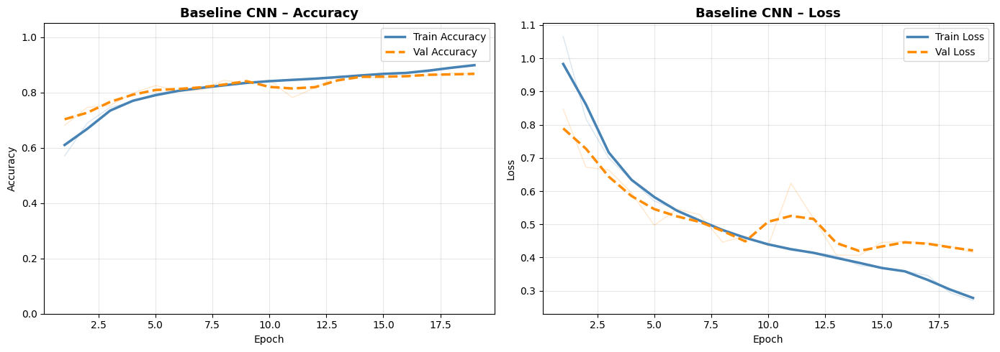

In [ ]:
# PLot baseline training curves
plot_history(baseline_history, model_name="Baseline CNN",
             save_path="baseline_training_curves.png")

Evaluating Baseline CNN on the held-out test set...
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8703 - loss: 0.3888

Baseline – Test Loss    : 0.4357
Baseline – Test Accuracy: 0.8513

  Baseline CNN – Classification Report (Test Set)
              precision    recall  f1-score   support

   buildings       0.82      0.87      0.84       437
      forest       0.92      0.98      0.95       474
     glacier       0.84      0.79      0.82       553
    mountain       0.83      0.79      0.81       525
         sea       0.84      0.83      0.83       510
      street       0.86      0.86      0.86       501

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000



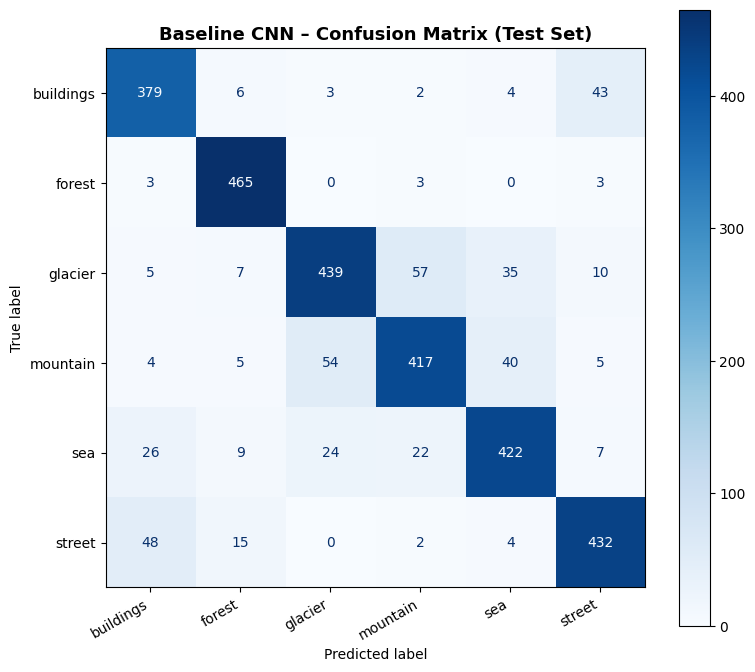

In [ ]:
#Evaluate baseline on test set
print("Evaluating Baseline CNN on the held-out test set...")

baseline_test_loss, baseline_test_acc = baseline_model.evaluate(
    test_generator, verbose=1
)
print(f"\nBaseline – Test Loss    : {baseline_test_loss:.4f}")
print(f"Baseline – Test Accuracy: {baseline_test_acc:.4f}")

baseline_metrics = evaluate_model(
    baseline_model, test_generator, CLASS_NAMES,
    model_name="Baseline CNN", save_prefix="baseline"
)

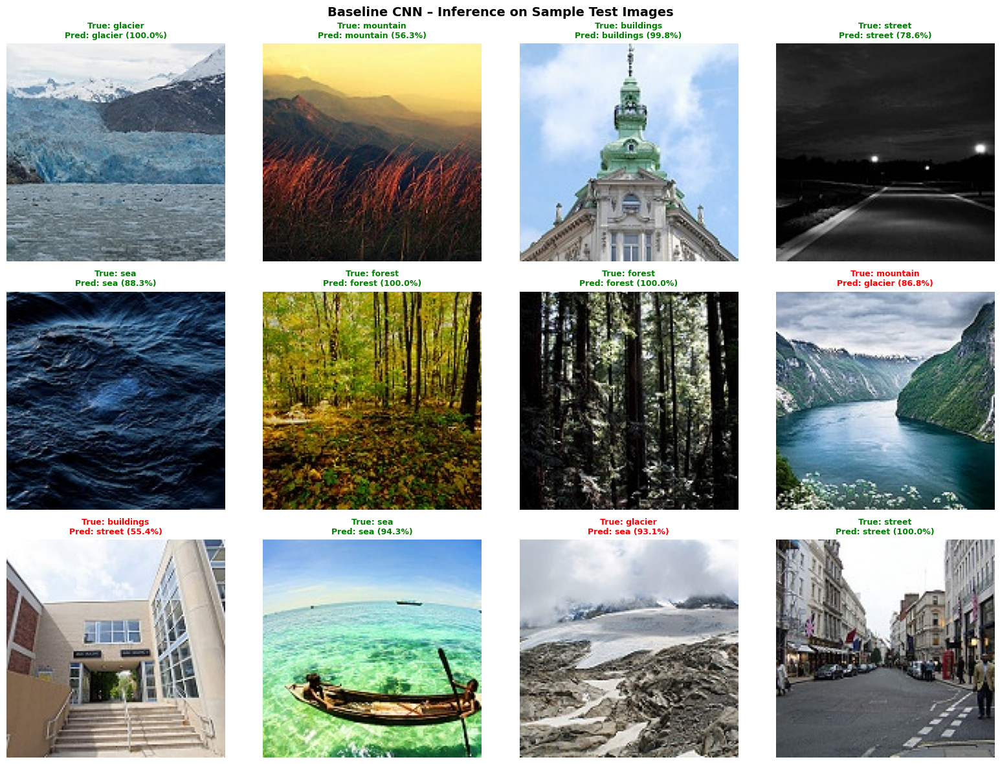

In [ ]:
#Baseline inference on sample images
inference_on_samples(
    baseline_model, TEST_DIR, CLASS_NAMES,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    num_samples=12,
    model_name="Baseline CNN",
    save_path="baseline_inference.png"
)

# Key Observations - Baseline CNN

- **Overall Performance:** For a basic CNN with only three convolutional blocks trained from scratch, the model performed quite well, achieving a final test accuracy of 85.13% and a test loss of 0.4357.
- **Training Curves & Overfitting**: Looking at the training vs. validation
  curves, Early Stopping kicked in at Epoch 19 (restoring weights from
  Epoch 14). We can see a growing gap between the training loss (which dropped
  down to ~0.26) and the validation loss (which hovered around ~0.40). This
  gap indicates the model was starting to overfit to the training data. This
  makes sense, as the baseline model doesn't use any regularisation techniques
  like Dropout or Batch Normalisation.
- **Class-Specific Metrics:** According to the classification report, the forest
  class was the easiest for the model to identify, achieving an F1-score
  of 0.95. On the other hand, mountain and glacier had the lowest F1-scores
  (0.81 and 0.82 respectively).
- **Confusion Matrix Analysis:** The confusion matrix visually confirms the
  overlap between visually similar classes. The model incorrectly predicted a
  glacier as a mountain 57 times, and a mountain as a glacier 54 times. There
  was also minor confusion between buildings and street, which is expected
  since they both share urban features.


# Deeper CNN Architecture with Regularisation
**Architecture Changes:**

I expanded my baseline model from 3 to 6 convolutional blocks. Stacking more layers allows the network to learn deeper hierarchical features, moving from basic edges in the early layers to complex scene structures in the deeper layers.

**Regularisation Techniques Added:**

Because deeper models are highly prone to overfitting, I introduced three specific regularisation techniques in my code:

**Batch Normalisation:** Added after every Conv2D layer to normalise inputs, stabilize the learning process, and act as a mild regulariser.

**Dropout:** Applied to the Dense layers to randomly drop neurons and prevent co-adaptation. I used a rate of 0.25 (25%) for the first two dense layers and 0.125 (12.5%) for the final one.

**L2 Regularisation:** Applied a 1e-4 penalty to the Dense layer weights to keep them small and prevent the model from memorising the training set.

In [ ]:
# Deeper CNN with Regularisation
def build_deeper_cnn(input_shape=(150, 150, 3), num_classes=6,
                     dropout_rate=0.25, l2_lambda=1e-4):
    """
    Build a deeper regularised CNN with:
      - 6 Convolutional blocks (double baseline depth)
      - Batch Normalisation after each Conv block
      - Dropout in Dense layers
      - L2 regularisation on Dense layers
      - Softmax output

    Parameters:
    input_shape  : tuple
    num_classes  : int
    dropout_rate : float   Fraction of neurons to drop (0.4 = 40%).
    l2_lambda    : float   L2 regularisation strength.

    Returns:
    keras.Model
    """
    l2_reg = regularizers.l2(l2_lambda)

    model = models.Sequential(name="Deeper_Regularised_CNN")

    # Block 1: 32 filters
    model.add(layers.Conv2D(32, (3, 3), padding='same',input_shape=input_shape, name='conv1a'))
    model.add(layers.BatchNormalization(name='bn1a'))
    model.add(layers.Activation('relu', name='relu1a'))

    # Block 2: 32 filters + pool
    model.add(layers.Conv2D(32, (3, 3), padding='same', name='conv1b'))
    model.add(layers.BatchNormalization(name='bn1b'))
    model.add(layers.Activation('relu', name='relu1b'))
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))

    # Block 3: 64 filters
    model.add(layers.Conv2D(64, (3, 3), padding='same', name='conv2a'))
    model.add(layers.BatchNormalization(name='bn2a'))
    model.add(layers.Activation('relu', name='relu2a'))

    #Block 4: 64 filters + pool
    model.add(layers.Conv2D(64, (3, 3), padding='same', name='conv2b'))
    model.add(layers.BatchNormalization(name='bn2b'))
    model.add(layers.Activation('relu', name='relu2b'))
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))

    #Block 5: 128 filters
    model.add(layers.Conv2D(128, (3, 3), padding='same', name='conv3a'))
    model.add(layers.BatchNormalization(name='bn3a'))
    model.add(layers.Activation('relu', name='relu3a'))

    # Block 6: 256 filters + pool
    model.add(layers.Conv2D(256, (3, 3), padding='same', name='conv3b'))
    model.add(layers.BatchNormalization(name='bn3b'))
    model.add(layers.Activation('relu', name='relu3b'))
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))

    #GlobalAveragePooling
    model.add(layers.GlobalAveragePooling2D(name='gap'))

    # FCN Layer 1: 512 neurons + Dropout
    model.add(layers.Dense(512, activation='relu',
                           kernel_regularizer=l2_reg, name='fc1'))
    model.add(layers.Dropout(dropout_rate, name='drop1'))

    #FCN Layer 2: 256 neurons + Dropout
    model.add(layers.Dense(256, activation='relu',
                           kernel_regularizer=l2_reg, name='fc2'))
    model.add(layers.Dropout(dropout_rate, name='drop2'))

    #FCN Layer 3: 128 neurons + Dropout
    model.add(layers.Dense(128, activation='relu',
                           kernel_regularizer=l2_reg, name='fc3'))
    model.add(layers.Dropout(dropout_rate / 2, name='drop3'))  # lighter dropout near output

    #Output layer
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model

deeper_model = build_deeper_cnn(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                num_classes=NUM_CLASSES)

print("=" * 65)
print("DEEPER REGULARISED CNN – MODEL SUMMARY")
print("=" * 65)
deeper_model.summary()

DEEPER REGULARISED CNN – MODEL SUMMARY


Model: "Deeper_Regularised_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1a (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1a (BatchNormalization)       │ (None, 150, 150, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1a (Activation)             │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1b (Conv2D)                 │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1b (BatchNormalization)       │ (None, 150, 150, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1b (Activation)             │ (None, 150, 150, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2a (Conv2D)                 │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2a (BatchNormalization)       │ (None, 75, 75, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2a (Activation)             │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2b (Conv2D)                 │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2b (BatchNormalization)       │ (None, 75, 75, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2b (Activation)             │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3a (Conv2D)                 │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3a (BatchNormalization)       │ (None, 37, 37, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3a (Activation)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3b (Conv2D)                 │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3b (BatchNormalization)       │ (None, 37, 37, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3b (Activation)             │ (None, 37, 37, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,32

 Total params: 733,478 (2.80 MB)

 Trainable params: 732,326 (2.79 MB)

 Non-trainable params: 1,152 (4.50 KB)

**Deeper Model Summary Interpretation:**

Looking at deeper model summary, the network now has 6 convolutional layers compared to the baseline's 3, which allows for richer feature extraction up to 256 filters. Despite doubling the depth, the total parameter count is only 733,478, massively reduced from the ~21.5 million parameters in my baseline.

The summary shows exactly why this happened: I replaced the Flatten layer with GlobalAveragePooling2D. If I had flattened the 18x18x256 output from pool3, it would have created 82,944 inputs, requiring over 42 million parameters for the first Dense layer alone. Instead, GAP shrinks this to just 256 inputs, requiring only 131,584 parameters (including biases) for fc1. Additionally, the summary lists 1,152 non-trainable parameters. These are simply the moving means and variances from my Batch Normalisation layers, which stabilize training without bloating the model.

In [ ]:
# Compile and train Deeper CNN (with Adam)
deeper_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

checkpoint_path = '/content/drive/MyDrive/best_deeper_adam.keras'
deeper_callbacks_adam =[
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1),
    ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True, verbose=0)
]

print("Training Deeper CNN with Adam...")
t0_deeper = time.time()

deeper_history_adam = deeper_model.fit(
    train_generator,
    epochs          = 40,
    validation_data = val_generator,
    callbacks       = deeper_callbacks_adam,
    verbose         = 1
)

deeper_train_time_adam = time.time() - t0_deeper
print(f"\nDeeper CNN (Adam) training completed in "
      f"{deeper_train_time_adam:.1f}s ({deeper_train_time_adam / 60:.1f} minutes)")

Training Deeper CNN with Adam...
Epoch 1/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 92s 227ms/step - accuracy: 0.5037 - loss: 1.2842 - val_accuracy: 0.4372 - val_loss: 1.5243 - learning_rate: 0.0010
Epoch 2/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.6807 - loss: 0.9022 - val_accuracy: 0.6797 - val_loss: 0.9058 - learning_rate: 0.0010
Epoch 3/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.7212 - loss: 0.8062 - val_accuracy: 0.6676 - val_loss: 0.9587 - learning_rate: 0.0010
Epoch 4/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 198ms/step - accuracy: 0.7515 - loss: 0.7401 - val_accuracy: 0.7076 - val_loss: 0.8260 - learning_rate: 0.0010
Epoch 5/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.7725 - loss: 0.6771 - val_accuracy: 0.6587 - val_loss: 1.0393 - learning_rate: 0.0010
Epoch 6/40
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 197ms/step - accuracy: 0.7962 - loss: 0.6174 - val_accuracy: 0.6708 - val_loss: 0.9011 - learning_rate: 0.0010
Epoch 7/40
351/351 ━━━━━━━━━━━━━━━━━━

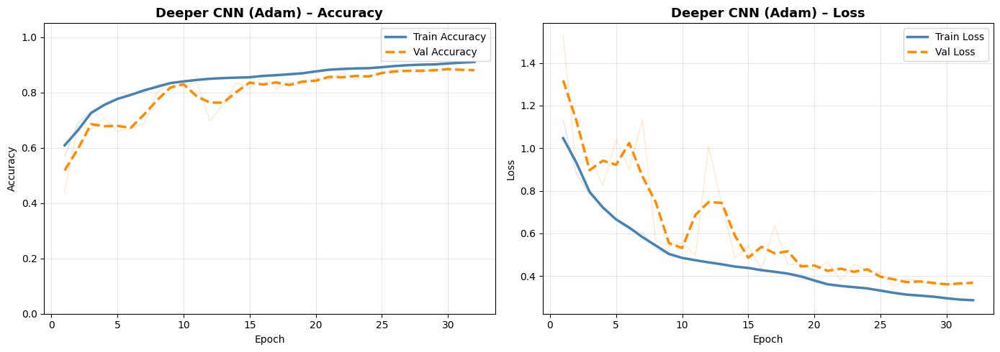

In [ ]:
#Plot deeper CNN training curves
plot_history(deeper_history_adam, model_name="Deeper CNN (Adam)",
             save_path="deeper_adam_training_curves.png")

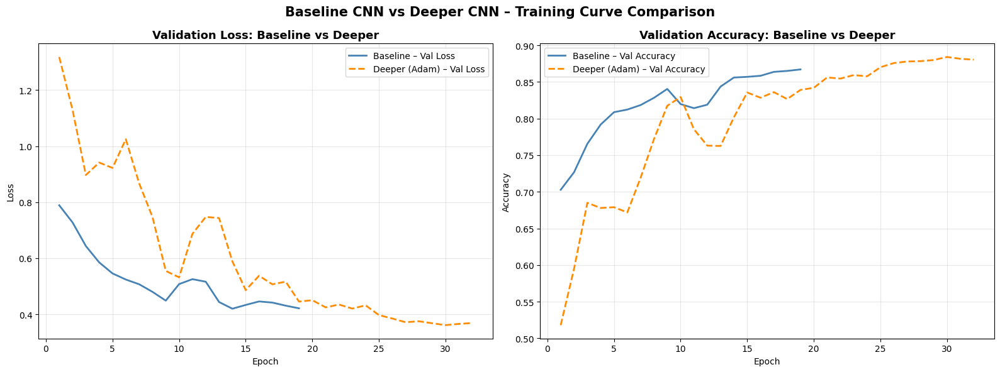


───────────────────────────────────────────────────────
  Training Time: Baseline vs Deeper
───────────────────────────────────────────────────────
  Baseline CNN (Adam) : 22.0 min
  Deeper CNN (Adam)   : 37.3 min
───────────────────────────────────────────────────────


In [ ]:
b_ep = range(1, len(baseline_history.history['val_loss']) + 1)
d_ep = range(1, len(deeper_history_adam.history['val_loss']) + 1)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Validation loss overlay
axes[0].plot(b_ep, smooth(baseline_history.history['val_loss']),
             label='Baseline – Val Loss', color='steelblue', linewidth=2)
axes[0].plot(d_ep, smooth(deeper_history_adam.history['val_loss']),
             label='Deeper (Adam) – Val Loss', color='darkorange', linewidth=2, linestyle='--')
axes[0].set_title('Validation Loss: Baseline vs Deeper', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(alpha=0.3)

# Validation accuracy overlay
axes[1].plot(b_ep, smooth(baseline_history.history['val_accuracy']),
             label='Baseline – Val Accuracy', color='steelblue', linewidth=2)
axes[1].plot(d_ep, smooth(deeper_history_adam.history['val_accuracy']),
             label='Deeper (Adam) – Val Accuracy', color='darkorange', linewidth=2, linestyle='--')
axes[1].set_title('Validation Accuracy: Baseline vs Deeper', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle('Baseline CNN vs Deeper CNN – Training Curve Comparison',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("baseline_vs_deeper_curves.png", dpi=150, bbox_inches='tight')
plt.show()

# Training time comparison
print(f"\n{'─'*55}")
print(f"  Training Time: Baseline vs Deeper")
print(f"{'─'*55}")
print(f"  Baseline CNN (Adam) : {baseline_train_time/60:.1f} min")
print(f"  Deeper CNN (Adam)   : {deeper_train_time_adam/60:.1f} min")
print(f"{'─'*55}")

94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8777 - loss: 0.3466

Deeper CNN (Adam) – Test Loss    : 0.3710
Deeper CNN (Adam) – Test Accuracy: 0.8777

  Deeper CNN (Adam) – Classification Report (Test Set)
              precision    recall  f1-score   support

   buildings       0.82      0.87      0.85       437
      forest       0.96      0.97      0.97       474
     glacier       0.87      0.80      0.83       553
    mountain       0.82      0.83      0.83       525
         sea       0.91      0.91      0.91       510
      street       0.90      0.89      0.90       501

    accuracy                           0.88      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.88      0.88      0.88      3000



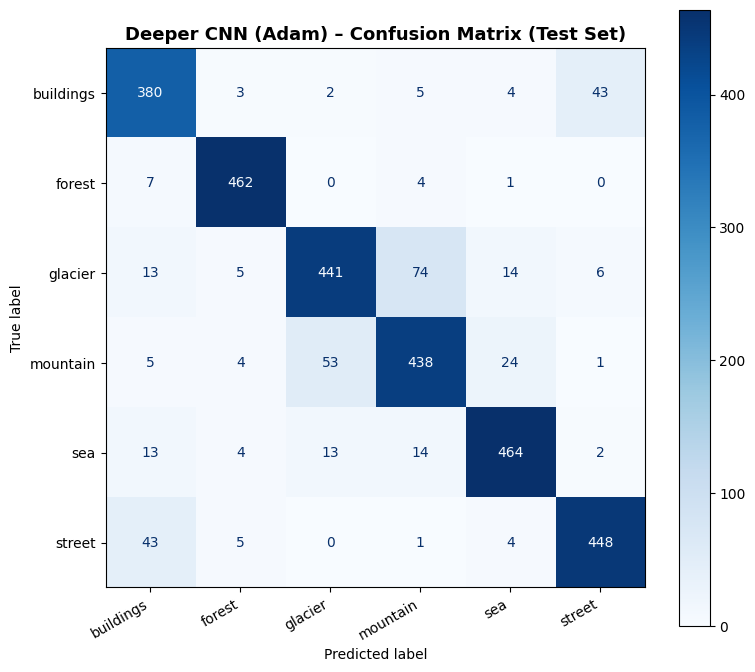

In [ ]:
# Evaluate deeper CNN on test set
deeper_test_loss, deeper_test_acc = deeper_model.evaluate(test_generator, verbose=1)
print(f"\nDeeper CNN (Adam) – Test Loss    : {deeper_test_loss:.4f}")
print(f"Deeper CNN (Adam) – Test Accuracy: {deeper_test_acc:.4f}")

deeper_metrics_adam = evaluate_model(
    deeper_model, test_generator, CLASS_NAMES,
    model_name="Deeper CNN (Adam)", save_prefix="deeper_adam"
)

# Improvements Compared to the Baseline Model:

Overall, the deeper architecture showed clear, measurable improvements over the baseline model across the board.

**Accuracy & Loss:** The test accuracy increased from 85.13% in the baseline to 87.77%, while the test loss improved significantly from 0.4357 down to 0.3710.

**Reduced Overfitting:** In the baseline model, I observed early signs of overfitting where the training and validation loss started drifting apart. In this deeper model, the validation loss tracked much more smoothly. This proves that adding Batch Normalisation, Dropout, and L2 regularisation successfully prevented the network from memorising the training data.

**Class-Specific Performance:** Thanks to the 6 convolutional blocks extracting richer hierarchical features, the model became better at distinguishing visually similar classes. For example, the F1-scores for the tricky 'glacier' and 'mountain' classes improved from 0.82 and 0.81 in the baseline to 0.83 for both. Meanwhile, easier classes like 'forest' reached a near-perfect F1-score of 0.97, proving the deeper feature extraction was highly effective.

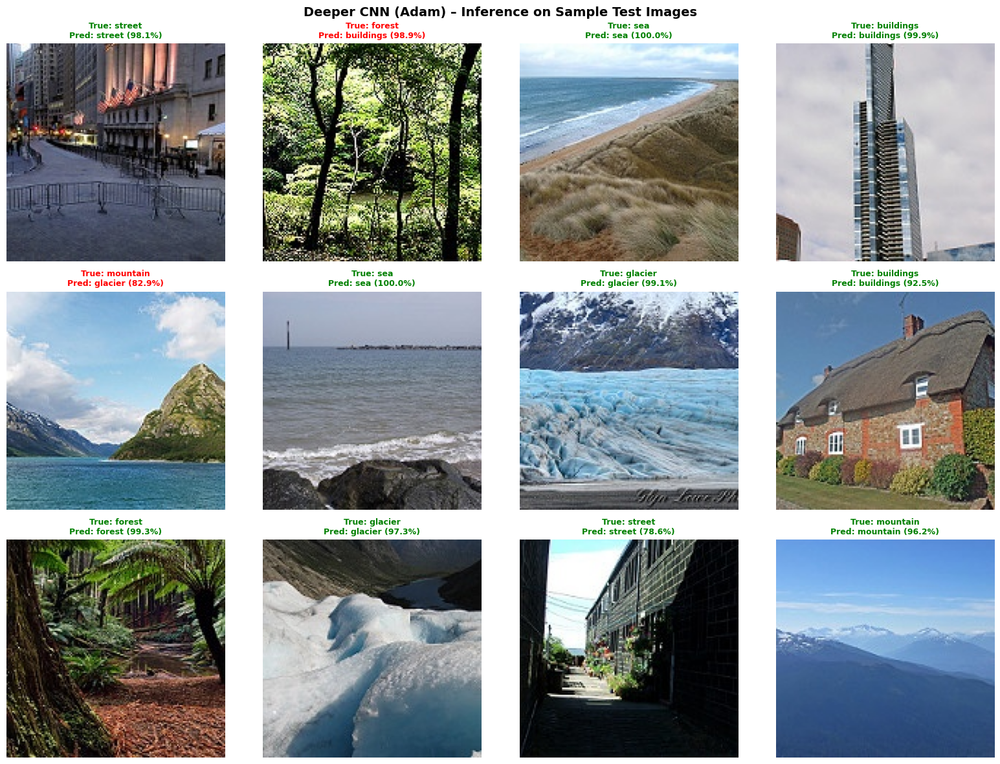

In [ ]:
# Deeper CNN inference on sample images
inference_on_samples(
    deeper_model, TEST_DIR, CLASS_NAMES,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    num_samples=12,
    model_name="Deeper CNN (Adam)",
    save_path="deeper_inference.png"
)

---
## 2.5.4 Experimentation and Comparative Analysis

### Section 3 – Optimizer Analysis: SGD vs Adam

We now retrain the **same deeper architecture** with **SGD** (with momentum) to compare against Adam. This isolates the effect of the optimiser.

**Why SGD with Momentum?**
- Plain SGD is slow on saddle points. Momentum (0.9) accumulates gradient history to accelerate past flat regions.
- SGD generally requires more epochs to converge but can sometimes find sharper, better-generalising minima.
- We use a learning rate of 0.01 with a decay schedule via `ReduceLROnPlateau`.

Training Deeper CNN with SGD+Momentum...
Epoch 1/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 85s 220ms/step - accuracy: 0.4657 - loss: 1.3503 - val_accuracy: 0.5521 - val_loss: 1.2573 - learning_rate: 0.0100
Epoch 2/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.6659 - loss: 0.9528 - val_accuracy: 0.4126 - val_loss: 1.6790 - learning_rate: 0.0100
Epoch 3/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 199ms/step - accuracy: 0.7207 - loss: 0.8420 - val_accuracy: 0.6462 - val_loss: 1.0721 - learning_rate: 0.0100
Epoch 4/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.7570 - loss: 0.7505 - val_accuracy: 0.7165 - val_loss: 0.8512 - learning_rate: 0.0100
Epoch 5/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.7604 - loss: 0.7383 - val_accuracy: 0.6637 - val_loss: 0.9432 - learning_rate: 0.0100
Epoch 6/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 200ms/step - accuracy: 0.7866 - loss: 0.6795 - val_accuracy: 0.7154 - val_loss: 0.9207 - learning_rate: 0.0100
Epoch 7/30
351/351 ━━━━━━━━━━

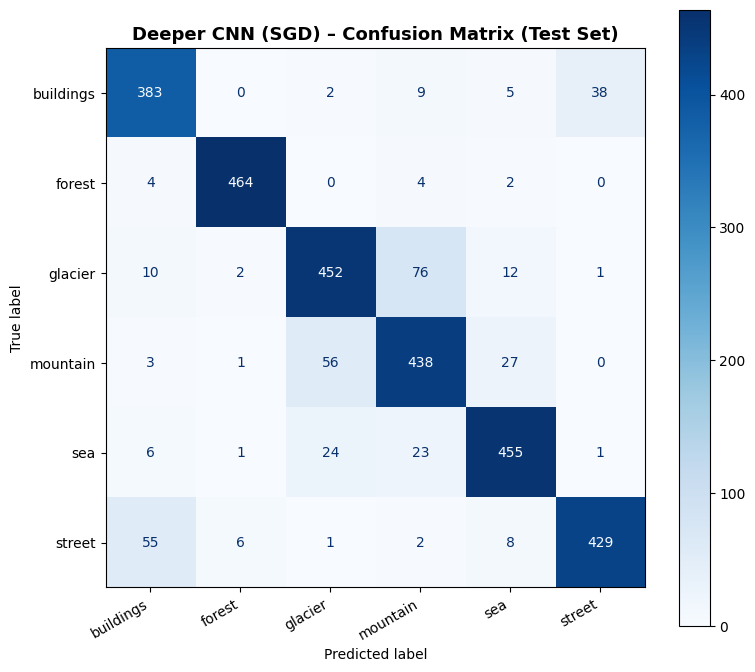

In [ ]:
# Rebuild and train Deeper CNN with SGD
deeper_model_sgd = build_deeper_cnn(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                    num_classes=NUM_CLASSES)
deeper_model_sgd.compile(
    optimizer = keras.optimizers.SGD(learning_rate=0.01,
                                     momentum=0.9, nesterov=True),  # nesterov=True uses a 'look-ahead' gradient, providing slightly faster convergence.
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

checkpoint_path = '/content/drive/MyDrive/best_deeper_sgd.keras'
deeper_callbacks_sgd =[
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True, verbose=0)
]

print("Training Deeper CNN with SGD+Momentum...")
t0_sgd = time.time()

deeper_history_sgd = deeper_model_sgd.fit(
    train_generator,
    epochs          = 30,   # EarlyStopping (patience=6) will stop before 30 if converged
    validation_data = val_generator,
    callbacks       = deeper_callbacks_sgd,
    verbose         = 1
)

deeper_train_time_sgd = time.time() - t0_sgd
print(f"\nDeeper CNN (SGD) training completed in "
      f"{deeper_train_time_sgd:.1f}s ({deeper_train_time_sgd / 60:.1f} minutes)")

deeper_test_loss_sgd, deeper_test_acc_sgd = deeper_model_sgd.evaluate(
    test_generator, verbose=1
)
deeper_metrics_sgd = evaluate_model(
    deeper_model_sgd, test_generator, CLASS_NAMES,
    model_name="Deeper CNN (SGD)", save_prefix="deeper_sgd"
)

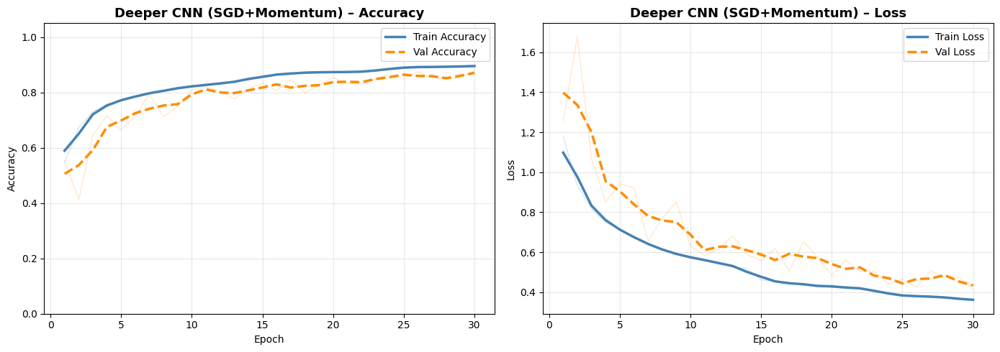

In [ ]:
#Plot SGD individual training curves
plot_history(deeper_history_sgd,
             model_name="Deeper CNN (SGD+Momentum)",
             save_path="deeper_sgd_training_curves.png")

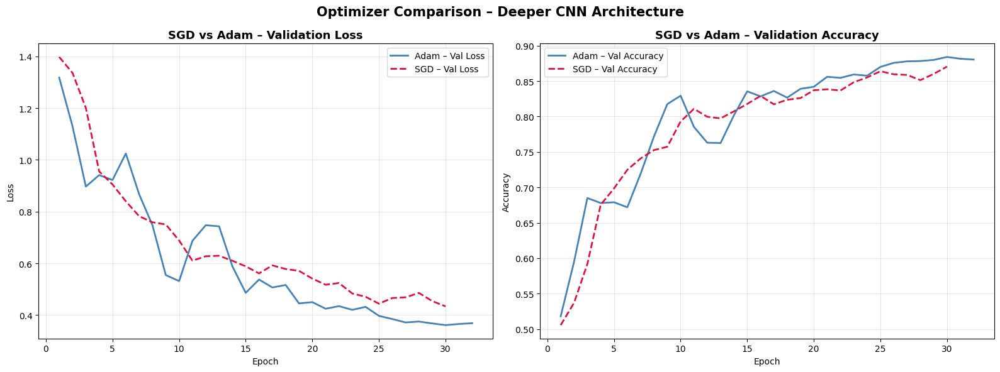

In [ ]:
#SGD vs Adam visual comparison
adam_ep = range(1, len(deeper_history_adam.history['val_loss']) + 1)
sgd_ep  = range(1, len(deeper_history_sgd.history['val_loss'])  + 1)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Loss comparison
axes[0].plot(adam_ep, smooth(deeper_history_adam.history['val_loss']),
             label='Adam – Val Loss', color='steelblue', linewidth=2)
axes[0].plot(sgd_ep,  smooth(deeper_history_sgd.history['val_loss']),
             label='SGD – Val Loss',  color='crimson',   linewidth=2, linestyle='--')
axes[0].set_title('SGD vs Adam – Validation Loss', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(alpha=0.3)

# Accuracy comparison
axes[1].plot(adam_ep, smooth(deeper_history_adam.history['val_accuracy']),
             label='Adam – Val Accuracy', color='steelblue', linewidth=2)
axes[1].plot(sgd_ep,  smooth(deeper_history_sgd.history['val_accuracy']),
             label='SGD – Val Accuracy',  color='crimson',   linewidth=2, linestyle='--')
axes[1].set_title('SGD vs Adam – Validation Accuracy', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle("Optimizer Comparison – Deeper CNN Architecture",
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("sgd_vs_adam.png", dpi=150, bbox_inches='tight')
plt.show()

### Section 4 – Ablation Study: Remove Dropout

An ablation study removes one component to measure its contribution. We remove **all Dropout layers** from the deeper architecture while keeping everything else identical. If the validation accuracy drops (or overfitting worsens), this confirms that Dropout is contributing meaningfully to regularisation.

Training Ablation Model (No Dropout)...
Epoch 1/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 212ms/step - accuracy: 0.5447 - loss: 1.1706 - val_accuracy: 0.4654 - val_loss: 1.6776 - learning_rate: 5.0000e-04
Epoch 2/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 197ms/step - accuracy: 0.7098 - loss: 0.8213 - val_accuracy: 0.6437 - val_loss: 0.9688 - learning_rate: 5.0000e-04
Epoch 3/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.7577 - loss: 0.7051 - val_accuracy: 0.7707 - val_loss: 0.6777 - learning_rate: 5.0000e-04
Epoch 4/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.7874 - loss: 0.6223 - val_accuracy: 0.7953 - val_loss: 0.6045 - learning_rate: 5.0000e-04
Epoch 5/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 197ms/step - accuracy: 0.7872 - loss: 0.6092 - val_accuracy: 0.7422 - val_loss: 0.7424 - learning_rate: 5.0000e-04
Epoch 6/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 195ms/step - accuracy: 0.8103 - loss: 0.5600 - val_accuracy: 0.7568 - val_loss: 0.6839 - learning_rate: 5.0000e-04
Epoch 

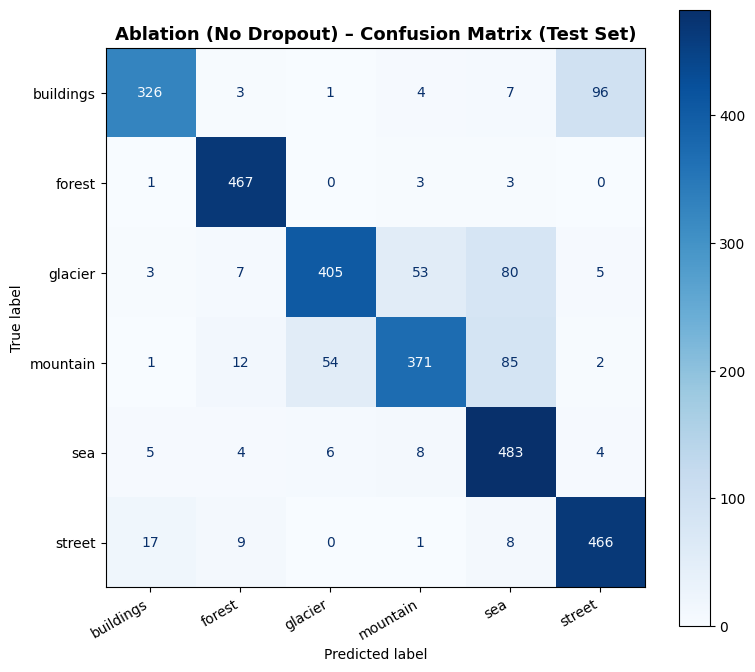


Ablation (No Dropout) – Test Accuracy: 0.8393
Deeper CNN (Adam)     – Test Accuracy: 0.8777
Dropout contribution  : +0.0383 accuracy points


In [ ]:
# Ablation: Deeper CNN without Dropout
def build_deeper_cnn_no_dropout(input_shape=(150, 150, 3), num_classes=6, l2_lambda=1e-4):
    """
    Same as build_deeper_cnn() but with ALL Dropout layers removed.
    Used for ablation study to isolate Dropout's contribution.
    """
    l2_reg = regularizers.l2(l2_lambda)
    model  = models.Sequential(name="Ablation_No_Dropout")

    model.add(layers.Conv2D(32,  (3,3), padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(32,  (3,3), padding='same'))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64,  (3,3), padding='same'))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(64,  (3,3), padding='same'))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.Conv2D(256, (3,3), padding='same'))
    model.add(layers.BatchNormalization()); model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.GlobalAveragePooling2D())

    # No dropout layers below
    model.add(layers.Dense(512, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(256, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(128, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


ablation_model = build_deeper_cnn_no_dropout(
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), num_classes=NUM_CLASSES
)
ablation_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=5e-4),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

print("Training Ablation Model (No Dropout)...")
t0_ablation = time.time()

ablation_callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
]
ablation_history = ablation_model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=ablation_callbacks, verbose=1
)

ablation_train_time = time.time() - t0_ablation

ablation_test_loss, ablation_test_acc = ablation_model.evaluate(test_generator, verbose=1)
ablation_metrics = evaluate_model(
    ablation_model, test_generator, CLASS_NAMES,
    model_name="Ablation (No Dropout)", save_prefix="ablation"
)

print(f"\nAblation (No Dropout) – Test Accuracy: {ablation_test_acc:.4f}")
print(f"Deeper CNN (Adam)     – Test Accuracy: {deeper_test_acc:.4f}")
delta = deeper_test_acc - ablation_test_acc
print(f"Dropout contribution  : {delta:+.4f} accuracy points")

In [ ]:
# Required: Total Training Time Report - Deeper Architecture
print(f"\n{'═'*62}")
print(f"  DEEPER ARCHITECTURE – COMPLETE TRAINING TIME REPORT")
print(f"{'═'*62}")
print(f"  Run 1 – Deeper CNN (Adam)         : "
      f"{deeper_train_time_adam/60:.2f} min  "
      f"({len(deeper_history_adam.history['loss'])} epochs run)")
print(f"  Run 2 – Deeper CNN (SGD+Momentum) : "
      f"{deeper_train_time_sgd/60:.2f} min  "
      f"({len(deeper_history_sgd.history['loss'])} epochs run)")
print(f"  Run 3 – Ablation (No Dropout)     : "
      f"{ablation_train_time/60:.2f} min  "
      f"({len(ablation_history.history['loss'])} epochs run)")
total = deeper_train_time_adam + deeper_train_time_sgd + ablation_train_time
print(f"{'─'*62}")
print(f"  Total (all 3 runs)                : {total/60:.2f} min")
print(f"{'─'*62}")
print(f"  Hardware  : Google Colab GPU (T4)")
print(f"  Framework : TensorFlow {tf.__version__} with CUDA acceleration")
print(f"  Note      : EarlyStopping prevented wasteful extra epochs.")
print(f"{'═'*62}")


══════════════════════════════════════════════════════════════
  DEEPER ARCHITECTURE – COMPLETE TRAINING TIME REPORT
══════════════════════════════════════════════════════════════
  Run 1 – Deeper CNN (Adam)         : 37.34 min  (32 epochs run)
  Run 2 – Deeper CNN (SGD+Momentum) : 35.40 min  (30 epochs run)
  Run 3 – Ablation (No Dropout)     : 17.50 min  (15 epochs run)
──────────────────────────────────────────────────────────────
  Total (all 3 runs)                : 90.25 min
──────────────────────────────────────────────────────────────
  Hardware  : Google Colab GPU (T4)
  Framework : TensorFlow 2.19.0 with CUDA acceleration
  Note      : EarlyStopping prevented wasteful extra epochs.
══════════════════════════════════════════════════════════════


In [ ]:
# Comprehensive Comparison Table

print("\n" + "═" * 80)
print(" FULL MODEL COMPARISON – PART A")
print("═" * 80)
print(f"{'Model':<30} {'Accuracy':>9} {'Precision':>10} {'Recall':>8} {'F1':>8} {'Time(min)':>10}")
print("─" * 80)

models_summary = [
    ("Baseline CNN (Adam)",       baseline_metrics,    baseline_train_time),
    ("Deeper CNN (Adam)",          deeper_metrics_adam, deeper_train_time_adam),
    ("Deeper CNN (SGD+Momentum)",  deeper_metrics_sgd,  deeper_train_time_sgd),
    ("Ablation – No Dropout",      ablation_metrics,    ablation_train_time),
]

for name, m, t in models_summary:
    time_str = f"{t / 60:.1f}" if t else "N/A"
    print(f"{name:<30} {m['accuracy']:>9.4f} {m['precision']:>10.4f} "
          f"{m['recall']:>8.4f} {m['f1']:>8.4f} {time_str:>10}")

print("═" * 80)


════════════════════════════════════════════════════════════════════════════════
 FULL MODEL COMPARISON – PART A
════════════════════════════════════════════════════════════════════════════════
Model                           Accuracy  Precision   Recall       F1  Time(min)
────────────────────────────────────────────────────────────────────────────────
Baseline CNN (Adam)               0.8513     0.8507   0.8513   0.8505       22.0
Deeper CNN (Adam)                 0.8777     0.8779   0.8777   0.8774       37.3
Deeper CNN (SGD+Momentum)         0.8737     0.8750   0.8737   0.8740       35.4
Ablation – No Dropout             0.8393     0.8484   0.8393   0.8371       17.5
════════════════════════════════════════════════════════════════════════════════


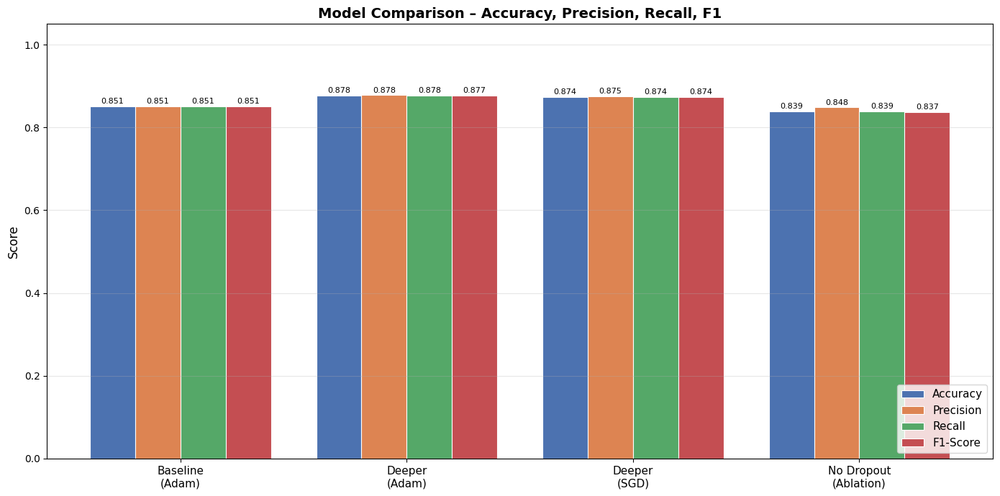

In [ ]:
# Bar chart: Metric comparison across models

model_labels = [
    "Baseline\n(Adam)",
    "Deeper\n(Adam)",
    "Deeper\n(SGD)",
    "No Dropout\n(Ablation)"
]
metrics_list = [baseline_metrics, deeper_metrics_adam, deeper_metrics_sgd, ablation_metrics]
metric_keys  = ['accuracy', 'precision', 'recall', 'f1']
metric_labels = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

x     = np.arange(len(model_labels))
width = 0.2
colors_bar = ['#4C72B0', '#DD8452', '#55A868', '#C44E52']

fig, ax = plt.subplots(figsize=(14, 7))
for i, (key, label) in enumerate(zip(metric_keys, metric_labels)):
    vals = [m[key] for m in metrics_list]
    bars = ax.bar(x + i * width, vals, width, label=label,
                  color=colors_bar[i], edgecolor='white', linewidth=0.8)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.003,
                f"{bar.get_height():.3f}",
                ha='center', va='bottom', fontsize=8)

ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(model_labels, fontsize=11)
ax.set_ylim(0, 1.05)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Model Comparison – Accuracy, Precision, Recall, F1',
             fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=11)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("model_comparison.png", dpi=150, bbox_inches='tight')
plt.show()

# Detailed Discussion
**1. Baseline vs. Deeper Model Performance**
The deeper model clearly outperformed the baseline, improving test accuracy from 85.13% to 87.77%. This boost confirms that adding more convolutional blocks (from 3 to 6) gave the network the capacity to learn finer-grained scene features. Additionally, using GlobalAveragePooling instead of Flatten kept the parameter count heavily optimized, while Batch Normalisation and Dropout allowed the network to learn these complex representations safely without memorising the training set.

**2. Computational Efficiency**
My baseline model took 22.0 minutes to train, while the deeper model took 37.3 minutes. The extra ~15 minutes is expected due to the doubled convolutional depth and the math required for Batch Normalisation. However, because I used Global Average Pooling to drastically reduce the parameters entering the fully connected layers, the per-epoch time remained highly manageable. The trade-off of 15 extra minutes is entirely worth the ~2.6% gain in final accuracy.

**3. Optimizer Analysis: SGD vs Adam**
When comparing optimizers on the deeper architecture, Adam yielded a final test accuracy of 87.77%, slightly edging out SGD+Momentum, which achieved 87.37%. Both finished in roughly similar times (37.3 mins for Adam vs 35.4 mins for SGD). While SGD with Nesterov momentum performed admirably and generalized well, Adam proved to be the better choice for this specific architecture, providing slightly higher accuracy and a better overall F1-score (0.8774 vs 0.8740).

**4. Ablation Study**
To prove whether my regularisation layers were actually helping, I ran an ablation model with all Dropout layers removed. Without Dropout, the test accuracy plummeted to 83.93%, and the training time dropped to 17.5 minutes (due to early stopping triggering sooner as the model overfit). Compared to my main deeper model (87.77%), removing Dropout cost exactly 0.0383 accuracy points (nearly 4%). This confirms that Dropout is doing critical regularisation work by preventing neuron co-adaptation.

**5. Challenges and Observations**

**Class Confusion: **The hardest challenge for the model was distinguishing "glacier" from "mountain" (both feature snowy/rocky textures) and "buildings" from "street" (both feature urban environments). Even my best SGD and Adam models hovered around 0.81–0.85 F1-scores for these specific classes, whereas visually distinct classes like "forest" easily scored 0.98.

**Overfitting:** The baseline model started to visibly overfit by epoch 15, as seen in the diverging loss curves. Implementing the deeper regularised architecture successfully solved this.

**Hardware:** Utilizing a Google Colab T4 GPU was absolutely crucial. Training the deeper architectures took roughly 35–37 minutes each; relying on a standard CPU would have bottlenecked this coursework and taken several hours per run.

---
# PART B – Fine-Tuning a Pre-Trained Model (Transfer Learning)
---

# Loading and Adapting MobileNetV2
**Why I Chose MobileNetV2:**

Instead of picking massive architectures like VGG16 (which has roughly 138 million parameters) or ResNet50 (~25 million parameters), I specifically chose MobileNetV2 because it is incredibly efficient, holding only about 3.4 million parameters. Since my Intel training dataset is moderately sized (roughly 11,200 images after my 80/20 validation split), a heavy model like VGG16 would overparameterize and easily overfit the data.

Furthermore, MobileNetV2 uses depthwise separable convolutions and inverted residuals, which are highly effective at capturing multi-scale features in natural landscapes—perfect for distinguishing between classes like 'mountain' and 'glacier'. Finally, using a lightweight base model ensures much faster convergence during fine-tuning.

**Adapting the Pre-Trained Model:**
To adapt this for my exact task, I loaded MobileNetV2 via Keras with include_top=False and weights='imagenet'. This preserved the rich feature representations learned from ImageNet but chopped off the original 1000-class prediction head. I then connected my own custom classification head consisting of a GlobalAveragePooling2D layer, two Dropout-regularised Dense layers, and a final Dense output layer with exactly 6 neurons (using softmax) to match the 6 categories of my Intel dataset.

In [ ]:
#Transfer Learning Configuration
TL_IMG_HEIGHT = 224
TL_IMG_WIDTH  = 224
TL_BATCH_SIZE = 32

#Data generators for Transfer Learning (224×224)
# Training generator WITH augmentation
tl_train_datagen = ImageDataGenerator(
    rescale            = 1.0 / 255.0,
    validation_split   = 0.2,
    horizontal_flip    = True,
    rotation_range     = 20,
    zoom_range         = 0.15,
    width_shift_range  = 0.1,
    height_shift_range = 0.1,
    fill_mode          = 'nearest'
)

# Validation generator - NO augmentation (separate object, same split ratio)
tl_val_datagen = ImageDataGenerator(
    rescale          = 1.0 / 255.0,
    validation_split = 0.2
)

tl_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

tl_train_generator = tl_train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size=TL_BATCH_SIZE, class_mode='categorical',
    subset='training', seed=SEED, shuffle=True
)
# Use tl_val_datagen (no augmentation) for honest validation metrics
tl_val_generator = tl_val_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size=TL_BATCH_SIZE, class_mode='categorical',
    subset='validation', seed=SEED, shuffle=False
)
tl_test_generator = tl_test_datagen.flow_from_directory(
    TEST_DIR, target_size=(TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size=TL_BATCH_SIZE, class_mode='categorical',
    shuffle=False
)

print(f"TL Train batches     : {len(tl_train_generator)}")
print(f"TL Validation batches: {len(tl_val_generator)}")
print(f"TL Test batches      : {len(tl_test_generator)}")

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
TL Train batches     : 351
TL Validation batches: 88
TL Test batches      : 94


In [ ]:
# Phase 1: Feature Extraction
def build_transfer_model(input_shape=(224, 224, 3), num_classes=6,
                         trainable_base=False, unfreeze_from_layer=None):
    """
    Build MobileNetV2 transfer learning model.

    Parameters
    ----------
    input_shape        : tuple
    num_classes        : int
    trainable_base     : bool   If True, unfreeze base layers.
    unfreeze_from_layer: str    Name of first layer to unfreeze (fine-tuning).

    Returns
    -------
    keras.Model
    """
    # Load pre-trained base (weights from ImageNet)
    base_model = MobileNetV2(
        input_shape = input_shape,
        include_top = False,        # Remove 1000-class head
        weights     = 'imagenet'    # Use ImageNet pre-trained weights
    )

    # Freeze/unfreeze
    if not trainable_base:
        base_model.trainable = False  # Freeze all base layers
    else:
        base_model.trainable = True
        if unfreeze_from_layer:
            # Freeze everything before unfreeze_from_layer, unfreeze the rest
            layer_names = [l.name for l in base_model.layers]
            freeze_idx  = layer_names.index(unfreeze_from_layer)
            for layer in base_model.layers[:freeze_idx]:
                layer.trainable = False

    # Custom classification head
    inputs  = keras.Input(shape=input_shape)
    # Two-stage normalisation
    x = keras.layers.Lambda(
        lambda img: img * 2.0 - 1.0,
        name='mobilenet_preprocess'
    )(inputs)
    x = base_model(x, training=False)  # training=False keeps BN frozen in feature extract
    x = layers.GlobalAveragePooling2D(name='gap')(x)
    x = layers.Dense(256, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4), name='fc1')(x)
    x = layers.Dropout(0.4, name='drop1')(x)
    x = layers.Dense(128, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4), name='fc2')(x)
    x = layers.Dropout(0.3, name='drop2')(x)
    outputs = layers.Dense(num_classes, activation='softmax', name='output')(x)

    model = keras.Model(inputs, outputs, name='MobileNetV2_TL')
    return model, base_model


# Build feature extraction model (base frozen)
tl_model, base_model = build_transfer_model(
    input_shape=(TL_IMG_HEIGHT, TL_IMG_WIDTH, 3),
    num_classes=NUM_CLASSES,
    trainable_base=False
)

print("=" * 65)
print("MobileNetV2 – Feature Extraction Phase (Base FROZEN)")
print("=" * 65)
tl_model.summary()

trainable_params    = sum([np.prod(w.shape) for w in tl_model.trainable_weights])
non_trainable_params = sum([np.prod(w.shape) for w in tl_model.non_trainable_weights])
print(f"\nTrainable params     : {trainable_params:,}  (our classification head only)")
print(f"Non-trainable params : {non_trainable_params:,} (frozen MobileNetV2 base)")

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MobileNetV2 – Feature Extraction Phase (Base FROZEN)


Model: "MobileNetV2_TL"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_preprocess (Lambda)   │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,619,590 (9.99 MB)

 Trainable params: 361,606 (1.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)


Trainable params     : 361,606  (our classification head only)
Non-trainable params : 2,257,984 (frozen MobileNetV2 base)


Phase 1 – Feature Extraction (frozen base)...
Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 149s 396ms/step - accuracy: 0.8941 - loss: 0.3310 - val_accuracy: 0.9126 - val_loss: 0.2921 - learning_rate: 0.0010
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 126s 358ms/step - accuracy: 0.8987 - loss: 0.3106 - val_accuracy: 0.9112 - val_loss: 0.2903 - learning_rate: 0.0010
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 126s 359ms/step - accuracy: 0.9034 - loss: 0.3051 - val_accuracy: 0.9126 - val_loss: 0.2964 - learning_rate: 0.0010
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step - accuracy: 0.9032 - loss: 0.3097
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
351/351 ━━━━━━━━━━━━━━━━━━━━ 124s 353ms/step - accuracy: 0.9032 - loss: 0.3097 - val_accuracy: 0.9130 - val_loss: 0.2929 - learning_rate: 0.0010
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 350ms/step - accuracy: 0.9114 - loss: 0.2836 - val_accuracy: 0.9187 - val_loss: 0.2861 - learning_rate: 5.0000e-04
Epoch 6/15
351/35

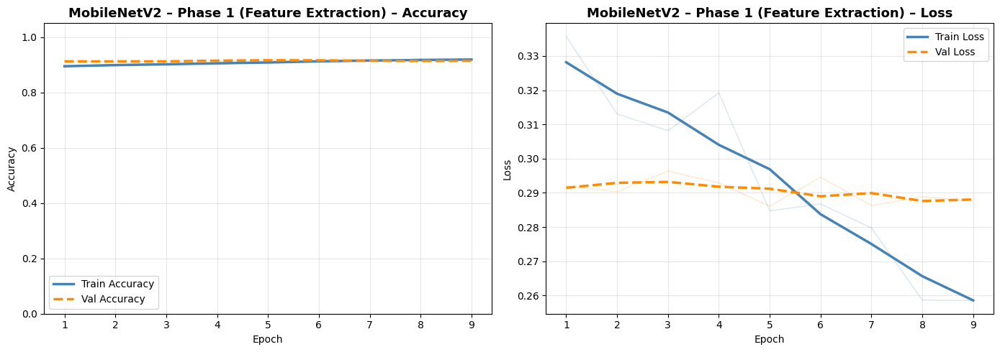

In [ ]:
# Phase 1 Training: Feature Extraction
tl_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

checkpoint_path = '/content/drive/MyDrive/best_tl_phase1.keras'
tl_phase1_callbacks = [
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1),
    ModelCheckpoint(checkpoint_path,
                    monitor='val_loss', save_best_only=True, verbose=0)
]

print("Phase 1 – Feature Extraction (frozen base)...")
t0_tl1 = time.time()

tl_history_phase1 = tl_model.fit(
    tl_train_generator,
    epochs          = 15,   #head converges quickly since base is frozen
    validation_data = tl_val_generator,
    callbacks       = tl_phase1_callbacks,
    verbose         = 1
)

tl_phase1_time = time.time() - t0_tl1
print(f"Phase 1 completed in {tl_phase1_time:.1f}s ({tl_phase1_time / 60:.1f} minutes)")
plot_history(tl_history_phase1, model_name="MobileNetV2 – Phase 1 (Feature Extraction)",
             save_path="tl_phase1_curves.png")

Frozen layers 0 – 124 (block_14_expand and later are now trainable)
Trainable base layers: 29 / 154

Phase 2 – Fine-Tuning (top base layers unfrozen, LR=1e-5)...
Epoch 1/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 154s 394ms/step - accuracy: 0.8240 - loss: 0.5271 - val_accuracy: 0.9130 - val_loss: 0.2962 - learning_rate: 1.0000e-05
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 124s 354ms/step - accuracy: 0.8746 - loss: 0.3858 - val_accuracy: 0.9112 - val_loss: 0.2951 - learning_rate: 1.0000e-05
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 121s 346ms/step - accuracy: 0.8935 - loss: 0.3418 - val_accuracy: 0.9101 - val_loss: 0.2876 - learning_rate: 1.0000e-05
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 121s 344ms/step - accuracy: 0.8954 - loss: 0.3354 - val_accuracy: 0.9173 - val_loss: 0.2793 - learning_rate: 1.0000e-05
Epoch 5/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 122s 346ms/step - accuracy: 0.9024 - loss: 0.3153 - val_accuracy: 0.9187 - val_loss: 0.2766 - learning_rate: 1.0000e-05
Epoch 6/20
351/351 ━━━━━━━━━━━━━━━━━━━

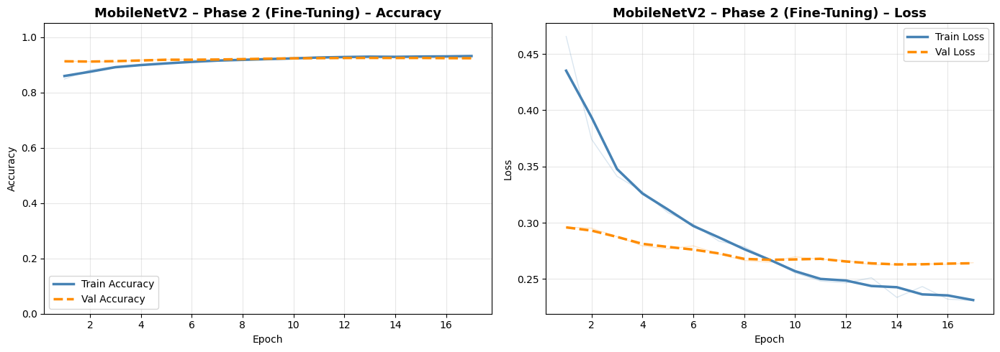

In [ ]:
# Phase 2: Fine-Tuning

# Unfreeze top layers of base model
UNFREEZE_FROM = 'block_14_expand'  # ~last 30 layers of MobileNetV2

base_model.trainable = True
layer_names = [l.name for l in base_model.layers]

if UNFREEZE_FROM in layer_names:
    freeze_idx = layer_names.index(UNFREEZE_FROM)
    for layer in base_model.layers[:freeze_idx]:
        layer.trainable = False
    print(f"Frozen layers 0 – {freeze_idx-1} ({UNFREEZE_FROM} and later are now trainable)")
else:
    print(f"Layer '{UNFREEZE_FROM}' not found; unfreezing all base layers.")

trainable_now = sum(1 for l in base_model.layers if l.trainable)
print(f"Trainable base layers: {trainable_now} / {len(base_model.layers)}")

tl_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-5),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

checkpoint_path = '/content/drive/MyDrive/best_tl_phase2.keras'
tl_phase2_callbacks =[
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-8, verbose=1),
    ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True, verbose=0)
]

print("\nPhase 2 – Fine-Tuning (top base layers unfrozen, LR=1e-5)...")
t0_tl2 = time.time()

tl_history_phase2 = tl_model.fit(
    tl_train_generator,
    epochs          = 20,
    validation_data = tl_val_generator,
    callbacks       = tl_phase2_callbacks,
    verbose         = 1
)

tl_phase2_time = time.time() - t0_tl2
print(f"\nPhase 2 completed in {tl_phase2_time:.1f}s ({tl_phase2_time / 60:.1f} minutes)")
plot_history(tl_history_phase2, model_name="MobileNetV2 – Phase 2 (Fine-Tuning)",
             save_path="tl_phase2_curves.png")

Evaluating MobileNetV2 (after fine-tuning) on test set...
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - accuracy: 0.9226 - loss: 0.2330

MobileNetV2 – Test Loss    : 0.2430
MobileNetV2 – Test Accuracy: 0.9250

  MobileNetV2 (Fine-Tuned) – Classification Report (Test Set)
              precision    recall  f1-score   support

   buildings       0.95      0.92      0.93       437
      forest       0.98      0.99      0.99       474
     glacier       0.88      0.87      0.87       553
    mountain       0.88      0.86      0.87       525
         sea       0.95      0.97      0.96       510
      street       0.93      0.96      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.92      0.93      0.92      3000



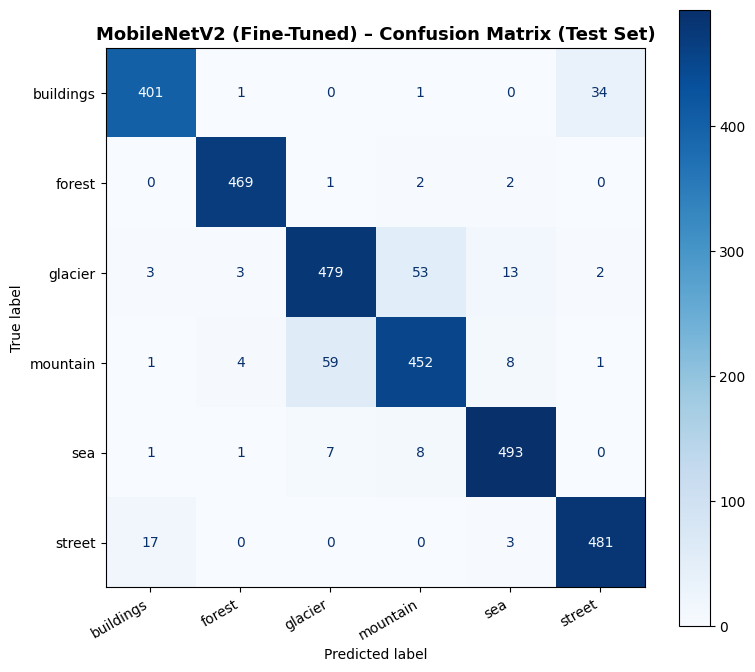

In [ ]:
#Evaluate Transfer Learning model
print("Evaluating MobileNetV2 (after fine-tuning) on test set...")

tl_test_loss, tl_test_acc = tl_model.evaluate(tl_test_generator, verbose=1)
print(f"\nMobileNetV2 – Test Loss    : {tl_test_loss:.4f}")
print(f"MobileNetV2 – Test Accuracy: {tl_test_acc:.4f}")

tl_metrics = evaluate_model(
    tl_model, tl_test_generator, CLASS_NAMES,
    model_name="MobileNetV2 (Fine-Tuned)", save_prefix="tl"
)

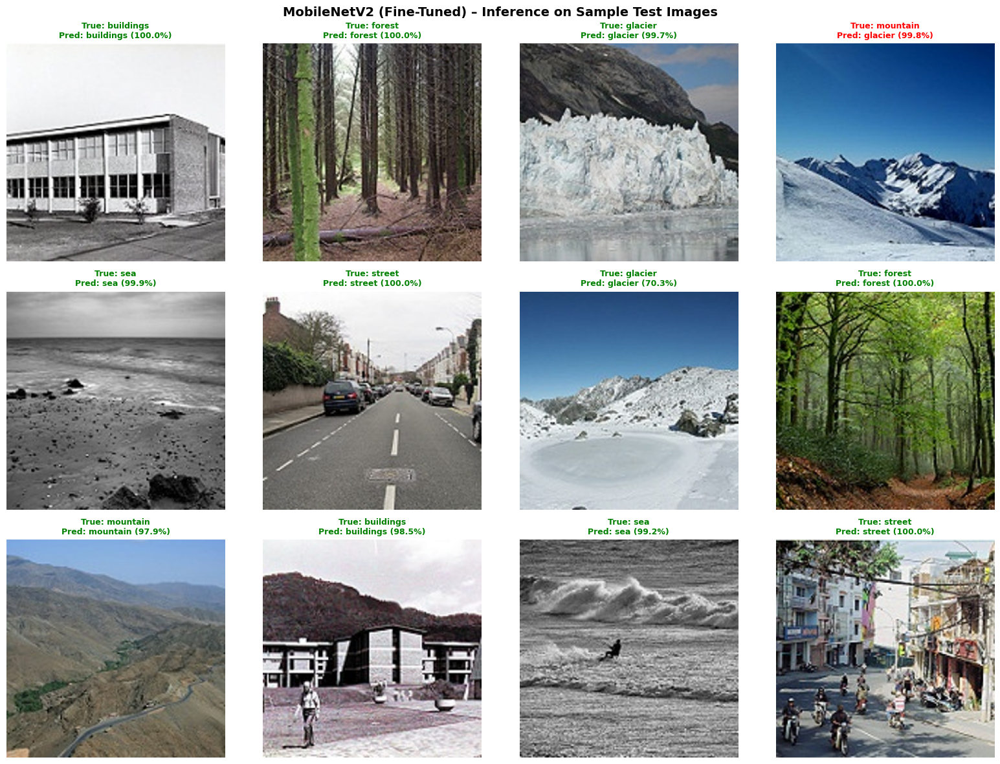

In [ ]:
#Transfer Learning inference on sample images
inference_on_samples(
    tl_model, TEST_DIR, CLASS_NAMES,
    img_size=(TL_IMG_HEIGHT, TL_IMG_WIDTH),
    num_samples=12,
    model_name="MobileNetV2 (Fine-Tuned)",
    save_path="tl_inference.png"
)

In [ ]:
# Final Comparison: All Models

print("\n" + "═" * 85)
print(" FINAL MODEL COMPARISON – PART A + PART B")
print("═" * 85)
print(f"{'Model':<35} {'Accuracy':>9} {'Precision':>10} {'Recall':>8} {'F1':>8}")
print("─" * 85)

final_comparison = [
    ("Baseline CNN (Adam, scratch)",     baseline_metrics),
    ("Deeper CNN (Adam, scratch)",        deeper_metrics_adam),
    ("Deeper CNN (SGD, scratch)",         deeper_metrics_sgd),
    ("Ablation – No Dropout",             ablation_metrics),
    ("MobileNetV2 (Transfer Learning)",   tl_metrics),
]

for name, m in final_comparison:
    print(f"{name:<35} {m['accuracy']:>9.4f} {m['precision']:>10.4f} "
          f"{m['recall']:>8.4f} {m['f1']:>8.4f}")

print("═" * 85)

# Gain from transfer learning
gain = tl_metrics['accuracy'] - deeper_metrics_adam['accuracy']
print(f"\nTransfer Learning gain over best scratch model: {gain:+.4f} ({gain*100:+.2f}%)")


═════════════════════════════════════════════════════════════════════════════════════
 FINAL MODEL COMPARISON – PART A + PART B
═════════════════════════════════════════════════════════════════════════════════════
Model                                Accuracy  Precision   Recall       F1
─────────────────────────────────────────────────────────────────────────────────────
Baseline CNN (Adam, scratch)           0.8513     0.8507   0.8513   0.8505
Deeper CNN (Adam, scratch)             0.8777     0.8779   0.8777   0.8774
Deeper CNN (SGD, scratch)              0.8737     0.8750   0.8737   0.8740
Ablation – No Dropout                  0.8393     0.8484   0.8393   0.8371
MobileNetV2 (Transfer Learning)        0.9250     0.9247   0.9250   0.9247
═════════════════════════════════════════════════════════════════════════════════════

Transfer Learning gain over best scratch model: +0.0473 (+4.73%)


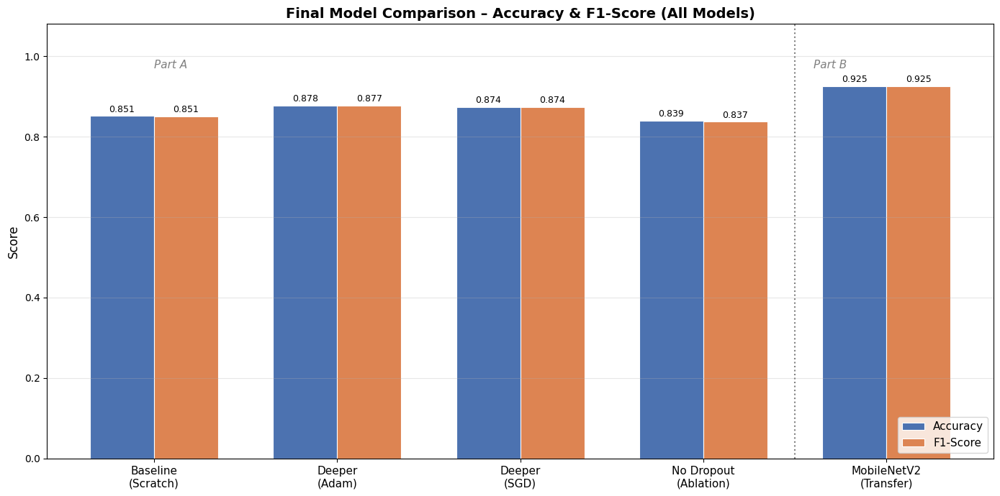

In [ ]:
# Final comparison bar chart

final_labels   = ["Baseline\n(Scratch)", "Deeper\n(Adam)",
                   "Deeper\n(SGD)", "No Dropout\n(Ablation)", "MobileNetV2\n(Transfer)"]
final_metrics  = [baseline_metrics, deeper_metrics_adam, deeper_metrics_sgd,
                  ablation_metrics, tl_metrics]
final_acc      = [m['accuracy'] for m in final_metrics]
final_f1       = [m['f1'] for m in final_metrics]

x     = np.arange(len(final_labels))
width = 0.35
fig, ax = plt.subplots(figsize=(14, 7))

b1 = ax.bar(x - width/2, final_acc, width, label='Accuracy',
            color='#4C72B0', edgecolor='white', linewidth=0.8)
b2 = ax.bar(x + width/2, final_f1,  width, label='F1-Score',
            color='#DD8452', edgecolor='white', linewidth=0.8)

for bar in list(b1) + list(b2):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.005,
            f"{bar.get_height():.3f}",
            ha='center', va='bottom', fontsize=9)

ax.set_xticks(x)
ax.set_xticklabels(final_labels, fontsize=11)
ax.set_ylim(0, 1.08)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Final Model Comparison – Accuracy & F1-Score (All Models)',
             fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=11)
ax.grid(axis='y', alpha=0.3)
ax.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, label='Part A | Part B')
ax.text(3.6, 0.97, 'Part B', fontsize=11, color='gray', style='italic')
ax.text(0, 0.97, 'Part A', fontsize=11, color='gray', style='italic')
plt.tight_layout()
plt.savefig("final_comparison.png", dpi=150, bbox_inches='tight')
plt.show()

---
## 2.6.3 Final Discussion – Does Transfer Learning Outperform Training from Scratch?
Based on the final evaluation metrics, yes, transfer learning significantly outperformed training from scratch for this dataset.

**Empirical Performance Gains:**
My best model trained from scratch (Deeper CNN with Adam) peaked at a test accuracy of 87.77%. By fine-tuning MobileNetV2, the accuracy surged to 92.50%; a massive absolute gain of +4.73%. Additionally, the test loss dropped heavily down to 0.2430, indicating the pre-trained model was far more confident in its predictions than the scratch models.

**Class-Specific Improvements:**
Looking at the final classification report, MobileNetV2's pre-trained weights drastically improved performance on the hardest classes. In my scratch models, 'mountain' and 'glacier' struggled with F1-scores around 0.81-0.83 due to their visual similarities. With MobileNetV2, the F1-scores for both jumped to 0.87. Furthermore, visually distinct classes like 'forest' reached a near-perfect F1-score of 0.99.

**Why Transfer Learning Won:**
This performance gap exists purely due to data efficiency and feature reuse. My scratch models had to learn what a "leaf" or a "building edge" looked like from just ~11,200 training images. MobileNetV2, having been pre-trained on 1.2 million ImageNet images, already had highly optimized filters for natural landscapes. By using a two-phase training strategy: first freezing the base to train my custom 6-class head, then unfreezing the top layers with a tiny learning rate of 1e-5, I was able to map those robust ImageNet features directly to my Intel dataset without destroying the pre-trained weights.

**When Transfer Learning Might Not Win:**
While transfer learning was the undisputed winner for this coursework, it only worked so well because ImageNet contains standard optical photos of outdoor scenes. If my task involved highly specialized visual domains that ImageNet hasn't seen-like microscopic medical X-rays or raw infrared satellite data, the pre-trained weights would have been much less relevant, and training from scratch might have been required.